# I.A. PROJECT - VISUAL CRYPTOGRAPHY WITH GENETIC ALGORITHMS
 



## David Enrique Molina Rodriguez - Christian Camilo Pabon Useche
### demolinar@unal.edu.co - ccpabonu@unal.edu.co
### Universidad Nacional de Colombia, Ciencias de la computación.

At present, the security of digital images has generated interest due to the constant and growing use of images on a daily basis, the number of sensitive images in databases of all types of companies is increasing, databases that can be violated losing the information and privacy of the users, in this work we will present a cryptosystem that with the help of genetic algorithms and the logistic equation of chaos are capable of encrypting images, it is also analyzed and compared with some other visual cryptosystems, where the best encrypted image It will be the one with the lowest correlation coefficient and the highest entropy, in the same way we will compare the time it can take to encrypt an image with each method.

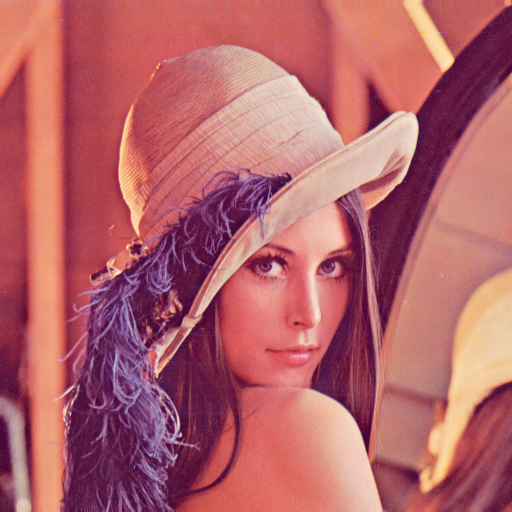

# Libraries

In [ ]:
import cv2 #Image manipulation library
import matplotlib.pyplot as plt #Library for graphing and plotting
import numpy as np 
import time #Library for measure time
from skimage import color #Image manipulation library
from skimage import io #Image manipulation library
import skimage.measure
from google.colab.patches import cv2_imshow #Library in colab for show cv2 images
import matplotlib.cm as cm #Library for graphing and plotting
from scipy import signal #Library for compute the image's correlation
import random as rd


# Functions

In [ ]:
def searchDiv (filesize, r, m):
  """
  Function that receives the total size of genes and searches a range for a divisor of the total size
  """
  div = 0                        # Returns this divisor
  for i in range(r,m*3):                 
    if filesize%i == 0 :
      div = i
      break;
  return div

def loadImage (filename, r) :
  """
  Function that takes the name of the image, converts it to a population of chromosomes
  Returns the populations with the length of the chromosomes.
  """ 
  image = cv2.imread(filename)           # We load the image as a pixel array with dimensions W*H*P
  w,h,p = image.shape                    # We get these dimensions
  filesize = w*h*p                       # We calculate the total number of elements of the matrix that we will call gene
  m = np.array([w,h]).max()
  ChromosomeLength = searchDiv(filesize, r, m)                     # We calculate a suitable length of the vectors that we call Chromosomes
  PopulationLength = filesize//ChromosomeLength                       # We calculate number of vectors(Chromosome) that we call Population
  flatImg = image.flatten()                                     # We flatten the matrix associated to the image
  population = flatImg.reshape(PopulationLength , ChromosomeLength)      # The population of chromosomes with the calculated length is created
  return population, ChromosomeLength, w,h,p  

def caotic_array(dim, initial, r):
    """
    This function compute a chaotic's array between 3.5 and 3.9999
    Input: Dim, the arrays' lenght
           the initial value
           r, Value \in (0,1)
    Output: "Y", chaotic's array

    """
    x = [r * initial * (1 - initial)]
    elements_size = dim -1
    for i in range(elements_size):
        x.append(r * x[-1] * (1 - x[-1]))
    return np.array(x)


def crossover_point(value, len_chromosome):
  """
  This function compute the crossover_point
  Input: Chaotic Value \in (0,1)
         Chromosome's lenght
  Output: Crossover Point
  """
  crossover_p = (round(1000*value))%(len_chromosome-1)+1 #Compute the natural number between 1 and the length of the chromosome 
  if crossover_p >= 1: 
    return crossover_p
  else:
    return 3


def mutation_point(value, len_chromosome):
  """
  This function compute the mutation_point
  Input: Chaotic Value \in (0,1)
         Chromosome's lenght
  Output: Crossover Point
  """
  m_point = ((round(1000*value))%(len_chromosome))
  return m_point


def crossover(chromosome_a, chromosome_b, chaotic_value, lenght_chromosome):
  """
  This function make crossover between two chromosomes.
  Input: Chromosome A
         Chromosome B
         Chaotic_value (value of the chaotic array)
         Chromosome's Lenght
  Output: Child A, and B

  """
  crossover_p = crossover_point(chaotic_value, lenght_chromosome) # We find the crossover_point for the crossover function 
  # print(crossover_p)
  child1 = (chromosome_a[0:crossover_p]+chromosome_b[crossover_p:len(chromosome_a)]) # Compute the child #1
  child2 = (chromosome_b[0:crossover_p]+chromosome_a[crossover_p:len(chromosome_a)]) # Compute the child #2

  return child1,child2


def mutation(chromosome, chaotic_value, lenght_chromosome):
  """
  This function make crossover between two chromosomes.
  Input: Chromosome A
         Chromosome B
         Chaotic_value (value of the chaotic array)
         Chromosome's Lenght
  Output: Child A, and B
  """
  c = 1
  for i in range(3):
    c+=1
    chaotic_value = chaotic_value*c
    mutation_p = mutation_point(chaotic_value, lenght_chromosome) # We find the mutation_point for the crossover function 
    chromosome[mutation_p] = ((chromosome[mutation_p]*(round(1000*chaotic_value)))% 255)


  return chromosome

def cov(x,y):
  return (((x-x.mean())*(y-y.mean())).sum())/len(x)

def d(x):
  return (((x-x.mean())**2).sum())/len(x)

def correlation(img,direction,color):
  img = img[:,:,color]
  if direction == 'vertical':
      r = 0
      for col in range(img.shape[1]-1):
          x = img[:,col]
          y = img[:,col+1]
          r += (cov(x,y))/(np.sqrt(d(x)*d(y)))
      return(r/img.shape[1])
  if direction == 'horizontal':
      r = 0
      for fila in range(img.shape[1]-1):
          x = img[fila,:]
          y = img[fila+1,:]
          r += (cov(x,y))/(np.sqrt(d(x)*d(y)))
      return(r/img.shape[1])

def printCorrelationVertical(image):
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,9))
  colors = ['Red','Green','Blue']
  
  for i in range(3):
      img = image[:,:,i]
      for col in range(img.shape[1]-1):
          ax[i].scatter(img[:,col][:-1], img[:,col][1:], [10]*(img.shape[1]-1))
          ax[i].set_title(colors[i])
          ax[i].set_xlabel('Pixel value of location (x,y)')
          ax[i].set_ylabel('Pixel value of location (x+1,y)')
    
def printCorrelationHorizontal(image):
  fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15,9))
  colors = ['Red','Green','Blue']
  for i in range(3):
      img = image[:,:,i]
      for row in range(img.shape[1]-1):
          ax[i].scatter(img[row,:][:-1], img[row,:][1:], [10]*(img.shape[1]-1))
          ax[i].set_title(colors[i])
          ax[i].set_xlabel('Pixel value of location (x,y)')
          ax[i].set_ylabel('Pixel value of location (x,y+1)')

def reShapeImage(population, h,w):
  img = population.flatten()
  matrix = np.array(img.reshape(h,w,3))
  return matrix

def histogram(image):
  _ = plt.hist(image.ravel(), bins = 256, color = 'orange', )
  _ = plt.hist(image[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
  _ = plt.hist(image[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
  _ = plt.hist(image[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
  _ = plt.xlabel('Intensity Value')
  _ = plt.ylabel('Count')
  _ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
  plt.show()

def getEntropy (imageMatrix) :
  return skimage.measure.shannon_entropy(imageMatrix)

In [ ]:
def crossover_point(value, len_chromosome):
  """
  This function compute the crossover_point
  Input: Chaotic Value \in (0,1)
         Chromosome's lenght
  Output: Crossover Point

  """
  crossover_p = round(10*value)%(len_chromosome-1)+1                        #Compute the natural number between 1 and the length of the chromosome 
  if crossover_p >= 1: 
    return crossover_p
  else:
    return 3

def GENETIC_ALGORITHM(image,array_chaotic, r, ep):
  population,lenght,w,h,p = loadImage(image, r)  
  epoch = 0
  count = 0
  start_time = time.time()
  while epoch <= ep:
    for i in range(round((h*p*w)/lenght)-1):
      chaotic_value = array_chaotic[count]
      chromosome_a = list(population[i])
      chromosome_b = list(population[i+1])
      child_a, child_b = crossover(chromosome_a, chromosome_b, chaotic_value, lenght)
      population[i] = child_a
      population[i+1] = child_b
      population[i] = mutation((population[i]), chaotic_value, lenght)
      population[i+1] = mutation((population[i+1]), chaotic_value, lenght)
      i += 1
      count += 1
    epoch +=1   
  print("--- %s seconds ---" % (time.time() - start_time))
  return population



# Study of Images in Cryptography

In this project we will focus on image encryption, which is the process where, given a recognizable image and an encryption algorithm, it is possible to transform said image to guarantee that it is not recognizable with respect to the clear image, additionally it does not matter that it is known how algorithm works, a good cryptosystem should still be secure even if the full working of the algorithm is known. In our cryptosystem we use a chaotic function, more precisely the logistic equation to generate pseudorandom numbers in sequence quickly and computationally cheaply, then with our pseudorandomly generated values ​​our genetic algorithm starts its goal by encrypting the image with a random initial population represented by sets of image bits in sequence that play the role of chromosomes, and where our fitness function is the correlation coefficient to qualify and decide who will produce new generations by combining them, additionally we randomly choose some chromosomes so that they also produce new generations with those decided by the fitness function and thus create a new population to which to mutate and carry out the same steps for each generation, this until our stopping criterion is met, we will explain all this with more detail later tea.

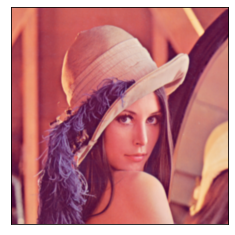

In [ ]:
filename = "lena.png"
image = cv2.imread(filename)
imgRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.xticks([]), plt.yticks([])
plt.imshow(imgRGB, cmap='gray', interpolation='bicubic')
plt.show()

# Correlation coefficient and entropy of an image



## Histogram

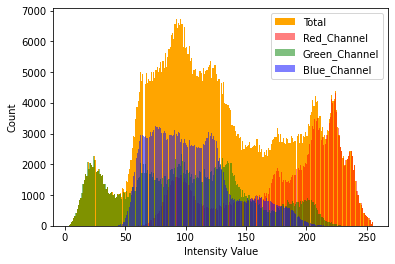

In [ ]:
image = io.imread(filename)

histogram(image)

##Correlation coefficient

### Vertical

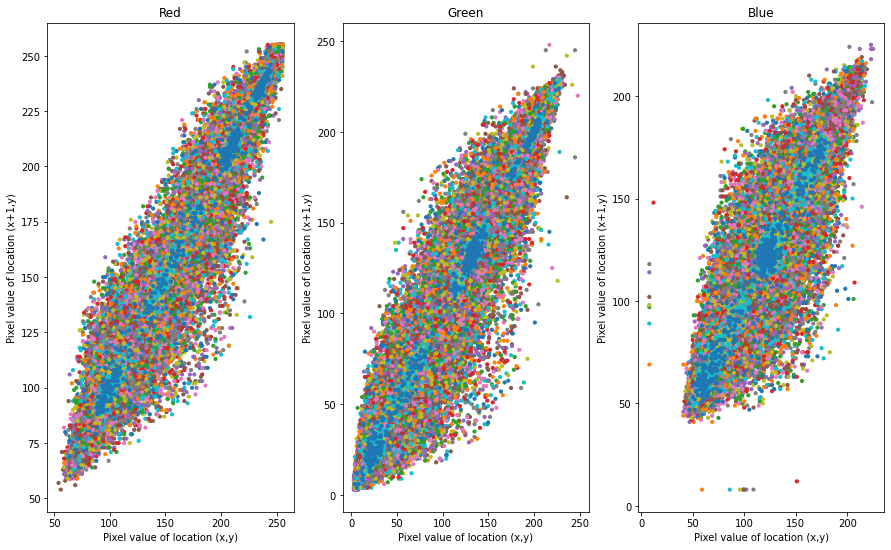

In [ ]:
printCorrelationVertical(image)

In [ ]:
corr1 = correlation(image,'vertical',0)
corr2 = correlation(image,'vertical',1)
corr3 = correlation(image,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.960988324941131
The vertical correlation coefficient of the green component is : 0.9378749986022907
The vertical correlation coefficient of the blue component is : 0.88273760754998


### Horizontal

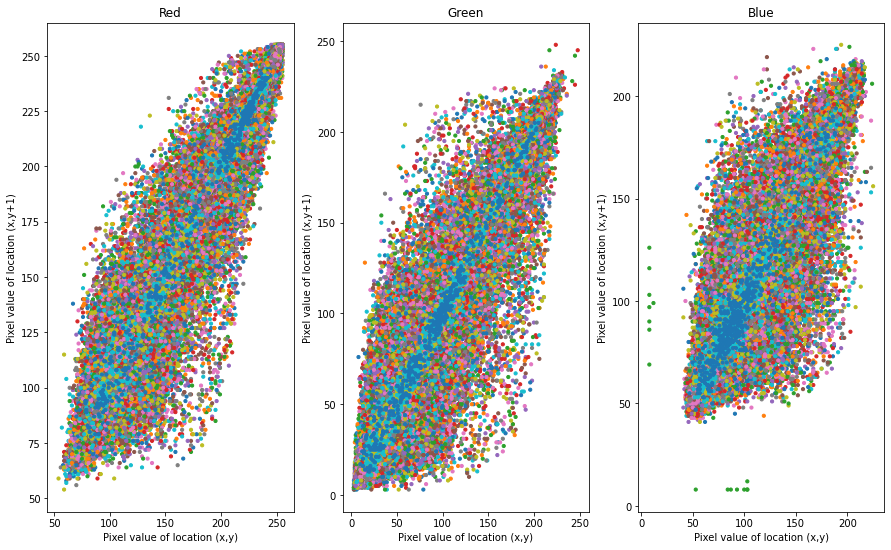

In [ ]:
printCorrelationHorizontal(image)

In [ ]:
corr1 = correlation(image,'horizontal',0)
corr2 = correlation(image,'horizontal',1)
corr3 = correlation(image,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.9863825358173648
The horizontal correlation coefficient of the green component is : 0.9799900769881047
The horizontal correlation coefficient of the blue component is : 0.9495955936699704


##Entropy

$H(S)=\sum_{i=0}^{2^N-1} P\left(s_i\right) \log \left(\frac{1}{P\left(s_i\right)}\right)$

In [ ]:

entropy1 = getEntropy(image[:,:,0])
entropy2 = getEntropy(image[:,:,1])
entropy3 = getEntropy(image[:,:,2])

print(f"The {filename} entropy of the red component is : {entropy1}")
print(f"The {filename} entropy of the green component is : {entropy2}")
print(f"The {filename} entropy of the blue component is : {entropy3}")


The lena.png entropy of the red component is : 7.253102357429206
The lena.png entropy of the green component is : 7.5940379163426845
The lena.png entropy of the blue component is : 6.9684269460085915


# Logistic Map

$$
X_{n+1}=r X_n\left(1-X_n\right)
$$



X = [3.3        3.30008751 3.30017502 ... 3.99982498 3.99991249 4.        ]
Y = [0.82360328 0.82362155 0.82363981 ... 0.83678597 0.30164373 0.        ]
Total = 3600000


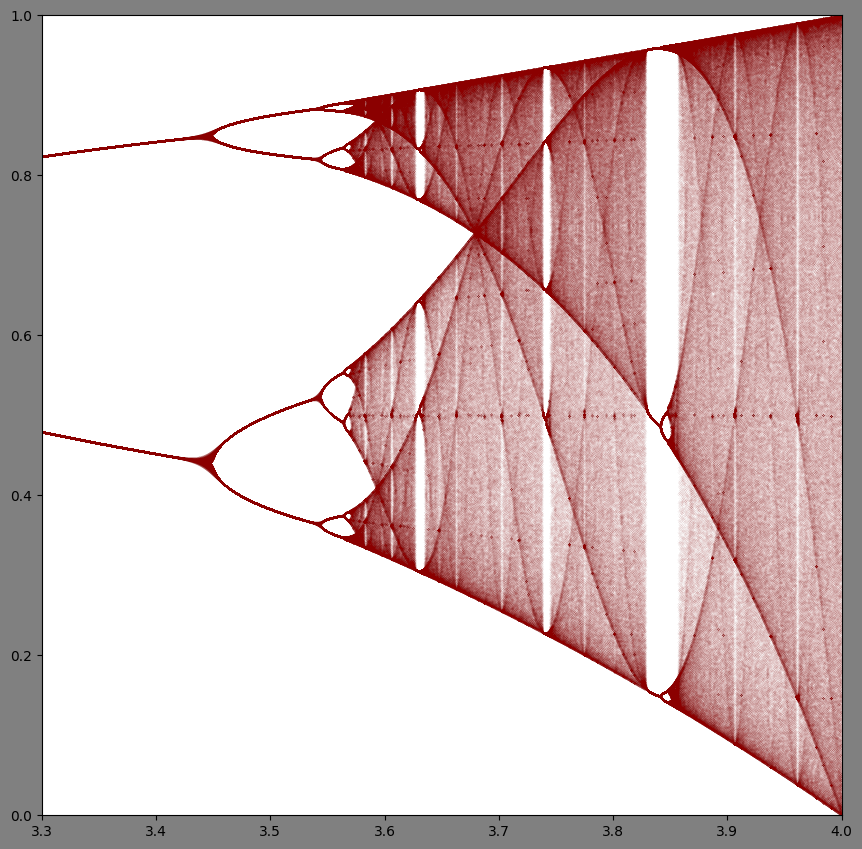

In [ ]:
y_ini = 0.5 
x_min, x_max = [3.3, 4] #Minimum and maximum domain point
y_min, y_max = [0, 1] #Minimum and maximum range point
iters = 500  #Number or iterations

%matplotlib inline

last = round(0.9*iters)
n_pixels = 8000
Zx = np.linspace(x_min, x_max, n_pixels)
y = np.repeat(y_ini, n_pixels)

for i in range(iters):
    y = Zx*y*(1-y)
    if i >= (iters-last): 
        if i == (iters-last): 
            D = np.array([Zx, y]).T
        else: D = np.concatenate([D,np.array([Zx, y]).T], axis = 0)            

X = D[:,0]
Y = D[:,1]

print(f'X = {X}')
print(f'Y = {Y}')
print(f'Total = {len(X)}')

fig, ax = plt.subplots(figsize=(8, 8),dpi=100, facecolor='gray', edgecolor='none')
plt.axis('on')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)
plt.margins(0,0)
plt.scatter(X,Y,s = (250/n_pixels)**2,alpha = 0.8,c = 'darkred',marker = '.')

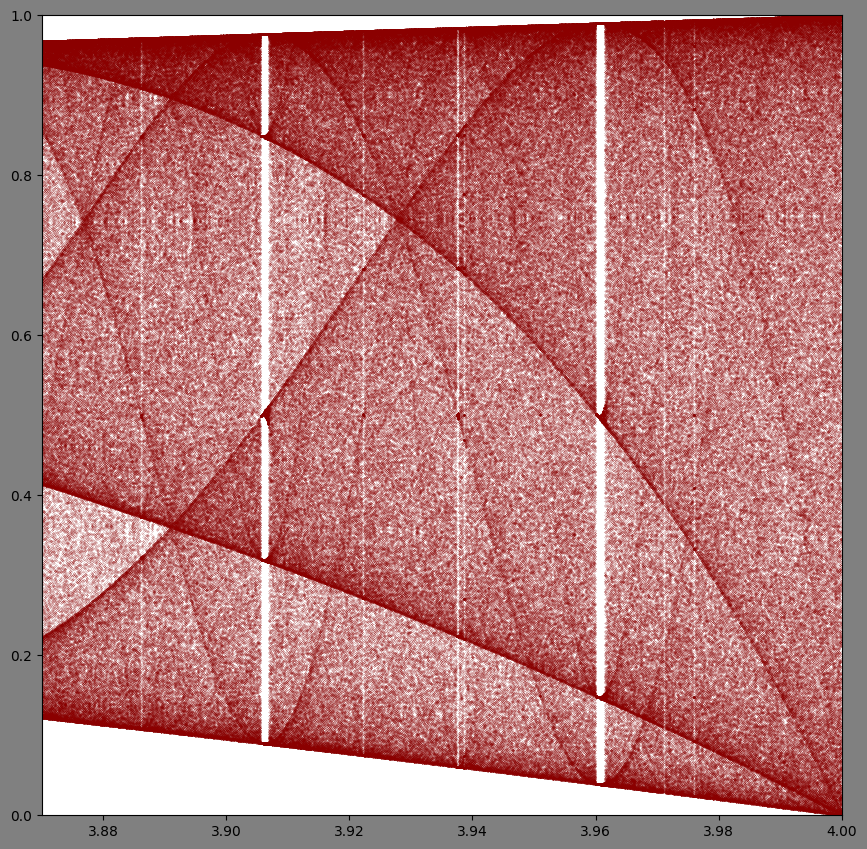

In [ ]:
y_ini = 0.5 
x_min, x_max = [3.87, 4] #Minimum and maximum domain point
y_min, y_max = [0, 1] #Minimum and maximum range point
iters = 1000  #Number or iterations

last = round(0.9*iters)
n_pixels = 800
Zx = np.linspace(x_min, x_max, n_pixels)
y = np.repeat(y_ini, n_pixels)

for i in range(iters):
    y = Zx*y*(1-y)
    if i >= (iters-last): 
        if i == (iters-last): 
            D = np.array([Zx, y]).T
        else: D = np.concatenate([D,np.array([Zx, y]).T], axis = 0)            
X = D[:,0]
Y = D[:,1]

fig, ax = plt.subplots(figsize=(8, 8),dpi=100, facecolor='gray', edgecolor='none')
plt.axis('on')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0, hspace = 0, wspace = 0)
plt.margins(0,0)
plt.scatter(X,Y,s = (250/n_pixels)**2,alpha = 0.8,c = 'darkred',marker = '.')


In [ ]:
start_time = time.time()
array_chaotic = caotic_array(10000000, 0.2, 3.9)
# array_chaotic = array_chaotic*1000
print("--- %s seconds ---" % (time.time() - start_time))
print(array_chaotic)

--- 3.2218661308288574 seconds ---
[0.624      0.9150336  0.30321373 ... 0.14291707 0.47771795 0.97306369]


# Genetic Algorithm

Genetic algorithms are heuristic searches inspired by the theory of evolution, where we have a population, chromosomes and genes, additionally we have a fitness function that helps us to optimize properly, and also with certain operations such as mutation and crossover. In our case, the initial population is the entire image made up of chromosomes that are chosen with an adequate size or number of genes according to our tests, where they are not larger than half the width of the image multiplied by three (since for each pixel we have three different channels of Red, Green and Blue colors), but it is not less than 4 either, since each epoch could take a long time, we will go into more detail about it later, additionally each gene has a value between 0 to 255 which is the amplitude of each channel. The offspring is possible thanks to our crossover operation, which takes two chromosomes and defines a point between the genes to exchange the left and right parts as seen in the image . In our new offspring, some genes may be subject to mutate with a certain random probability, this to maintain the diversity of colors in our channels.

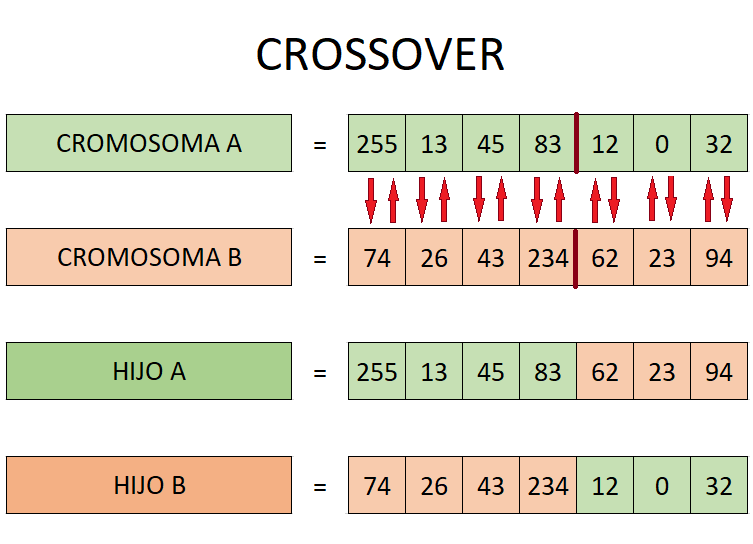

Finally, it is the fitness function which determines how good our chromosome is, in our case, thanks to a previous selection of the fittest with respect to the color correlation coefficient.

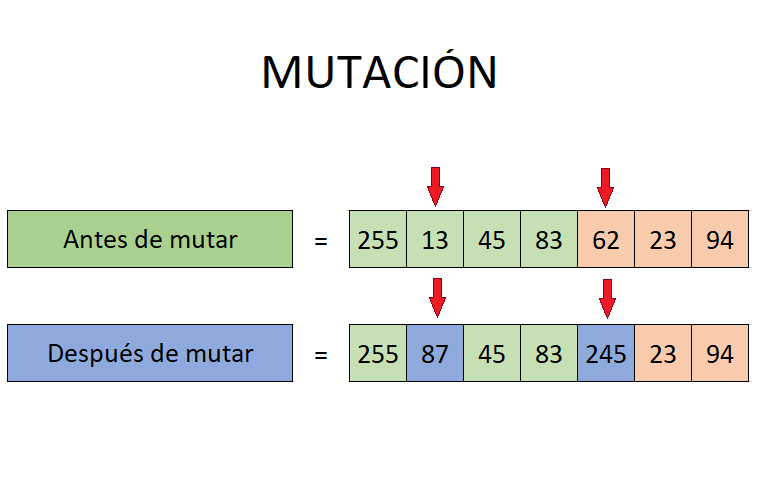

## Blocks Diagram

Once we have all the peculiarities understood, we are going to unify them, for this we will use the diagram where we start with the arguments that our program requires, we start with the arguments that are not mandatory but that more, however, they are available to study the cryptosystem, these arguments are, the number of epochs and the length of the chromosomes, by default they are 70 and 64 respectively, however there is no limit established by the program, however there are clear limitations which are dictated by the size of the image, i.e. the length of the chromosome cannot be more than half the total size of the image $\text{(Height} \times \text{Width} \times 3)$ already that there was no chance of more than one chromosome. The number of epochs is also configurable, where the minimum amount is one epoch. The required arguments are the image which can be of any size and any set of colors and the following variable $r$ which represents the rate of

$$X_{n+1}=r X_n\left(1-X_n\right),$$

The logistic map equation also represents our key, since it is quite sensitive to any change in its decimals, which can guarantee us a good starting point to start encrypting.

Once our parameters have been successfully entered, we proceed to calculate the array with pseudorandom values ​​but traceable thanks to our $r$ key. This array is of a length necessary to cover the number of iterations given by our parameters. Now we proceed to the creation of the initial population, which by default has a value close to 64 due to its rapid convergence to a low correlation coefficient. We say close because it is possible that due to the size of the image, 64 is not a divisor of the total size. , however very surely there will be divisors close to this number, although there is also the possibility of choosing the length with the non-mandatory argument. Then we enter the epoch loop, which is in charge of producing the epochs established by the user or those established by the process itself, where it internally executes the population loop that represents going through the image classifying good candidates, crossovering and executing offspring mutations.

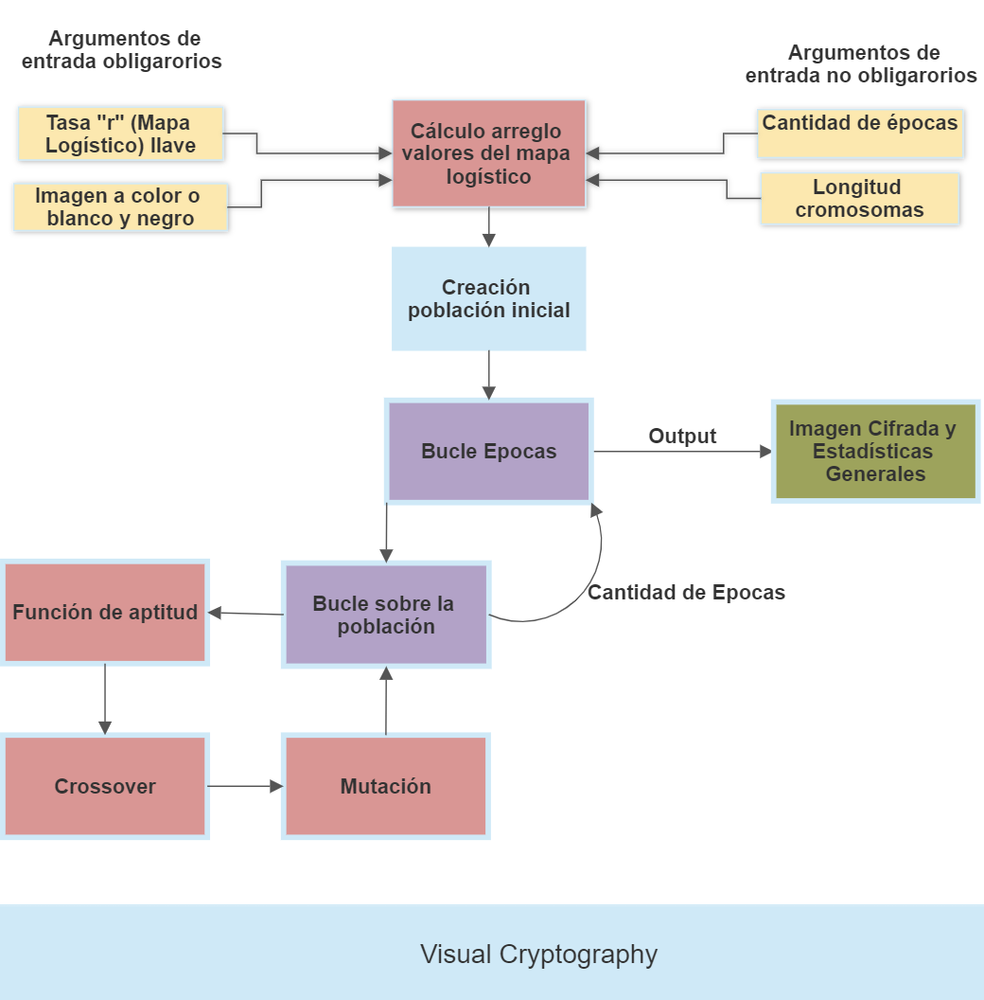

# Results

## r = 60
## epoch = 15

In [ ]:
filename = 'lena.png'
r = 60
ep = 15
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)



--- 13.233067274093628 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

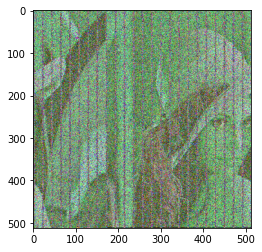

In [ ]:
image2 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image2)
plt.show

###Histogram

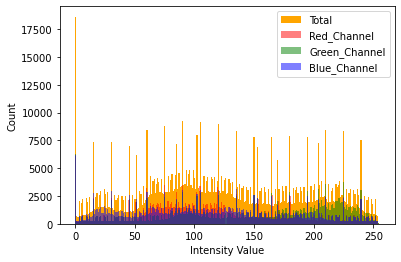

In [ ]:
histogram(image2)

###Correlation coefficient

#### Vertical

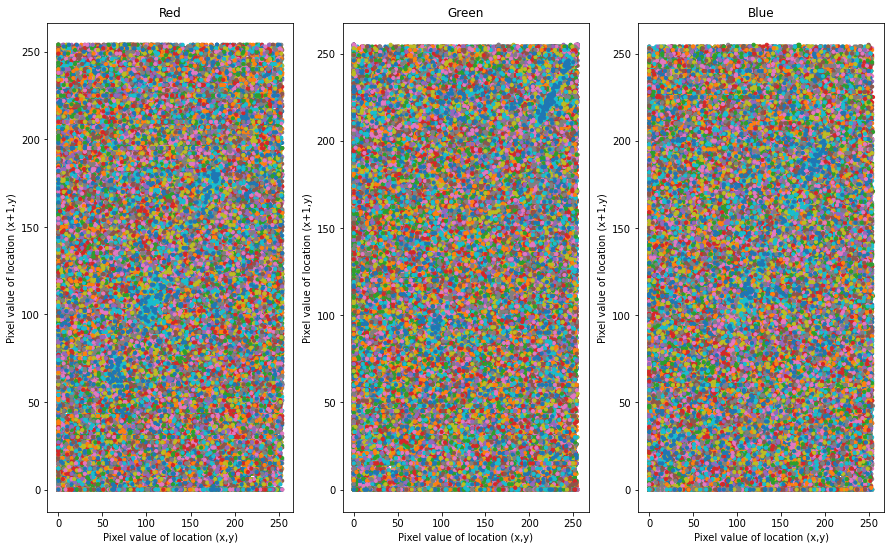

In [ ]:
printCorrelationVertical(image2)

In [ ]:
corr1 = correlation(image2,'vertical',0)
corr2 = correlation(image2,'vertical',1)
corr3 = correlation(image2,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.04517875832332329
The vertical correlation coefficient of the green component is : 0.06788901005210864
The vertical correlation coefficient of the blue component is : 0.08439698494584144


#### Horizontal

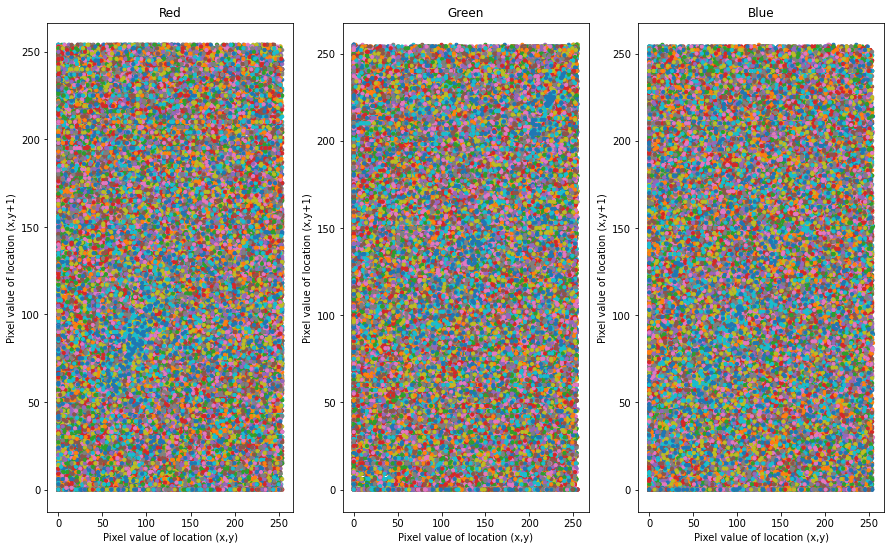

In [ ]:
printCorrelationHorizontal(image2)

In [ ]:
corr1 = correlation(image2,'horizontal',0)
corr2 = correlation(image2,'horizontal',1)
corr3 = correlation(image2,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.06003329450345576
The horizontal correlation coefficient of the green component is : 0.11234822152751633
The horizontal correlation coefficient of the blue component is : 0.11235877923816552


## r = 60
## epoch = 70

In [ ]:
filename = 'lena.png'
r = 60
ep = 70
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)



--- 57.56879806518555 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

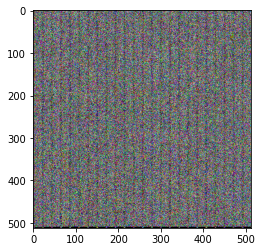

In [ ]:
image3 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image3)
plt.show

###Histogram

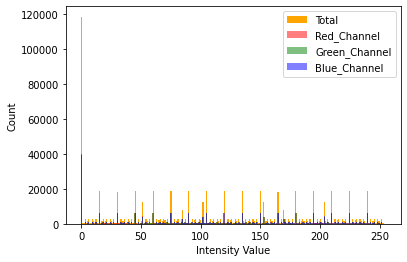

In [ ]:
histogram(image3)

###Correlation coefficient

#### Vertical

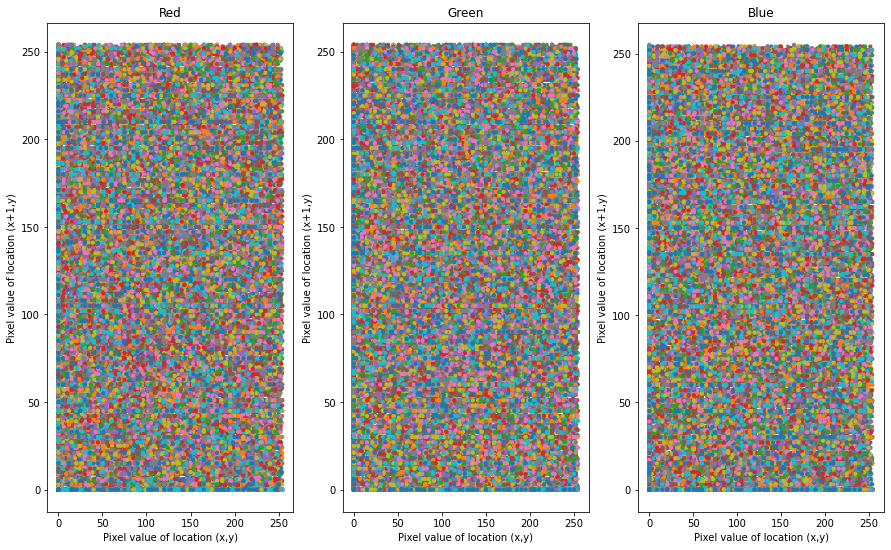

In [ ]:
printCorrelationVertical(image3)

In [ ]:
corr1 = correlation(image3,'vertical',0)
corr2 = correlation(image3,'vertical',1)
corr3 = correlation(image3,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.008449029593023964
The vertical correlation coefficient of the green component is : 0.007871926369934246
The vertical correlation coefficient of the blue component is : 0.01081741266480167


#### Horizontal

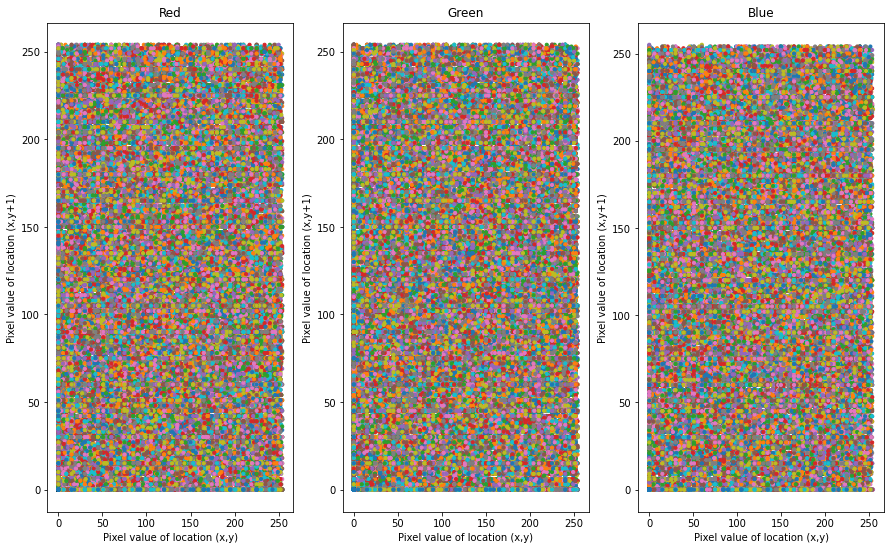

In [ ]:
printCorrelationHorizontal(image3)

In [ ]:
corr1 = correlation(image3,'horizontal',0)
corr2 = correlation(image3,'horizontal',1)
corr3 = correlation(image3,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.01192054471738753
The horizontal correlation coefficient of the green component is : 0.008804969768591797
The horizontal correlation coefficient of the blue component is : 0.01299999472618063


## r = 60
## epoch = 140

In [ ]:
filename = 'lena.png'
r = 60
ep = 140
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)



--- 104.69596815109253 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

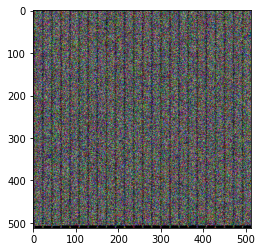

In [ ]:
image4 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image4)
plt.show

###Histogram

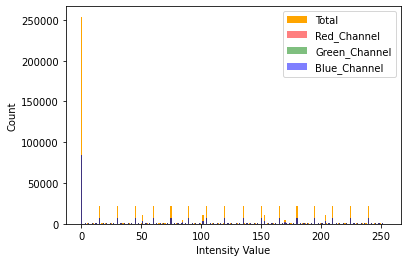

In [ ]:
histogram(image4)

###Correlation coefficient

#### Vertical

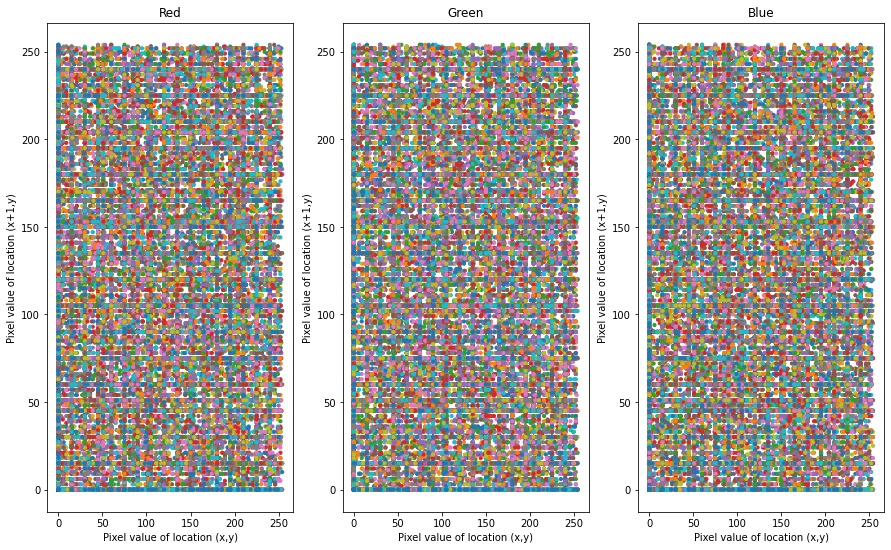

In [ ]:
printCorrelationVertical(image4)

In [ ]:
corr1 = correlation(image4,'vertical',0)
corr2 = correlation(image4,'vertical',1)
corr3 = correlation(image4,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.01162441215607955
The vertical correlation coefficient of the green component is : 0.012924650001123627
The vertical correlation coefficient of the blue component is : 0.009287306946772218


#### Horizontal

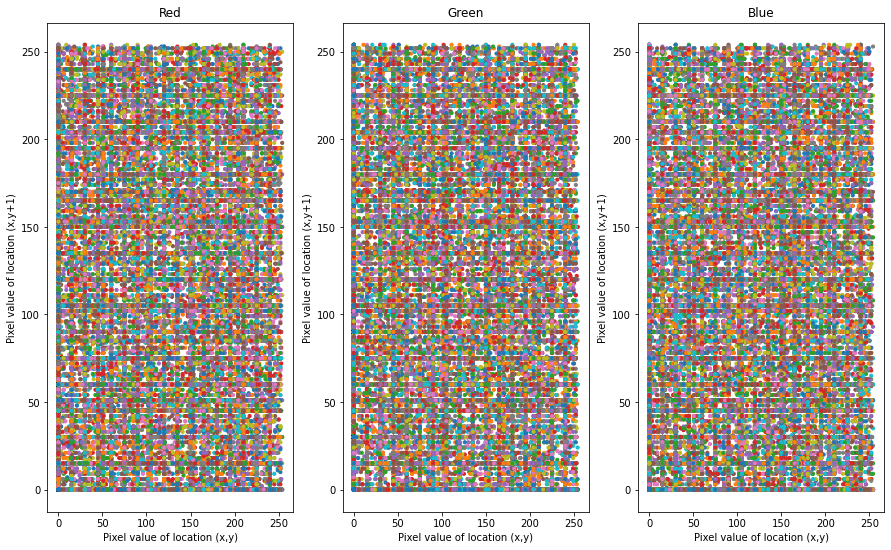

In [ ]:
printCorrelationHorizontal(image4)

In [ ]:
corr1 = correlation(image4,'horizontal',0)
corr2 = correlation(image4,'horizontal',1)
corr3 = correlation(image4,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.028532302028986788
The horizontal correlation coefficient of the green component is : 0.029596389130976182
The horizontal correlation coefficient of the blue component is : 0.027684498658760527


## r = w+1
## epoch = 15

In [ ]:
filename = 'lena.png'
r = w+1
ep = 15
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)


--- 2.8730154037475586 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

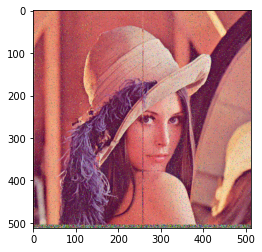

In [ ]:
image4 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image4)
plt.show

###Histogram

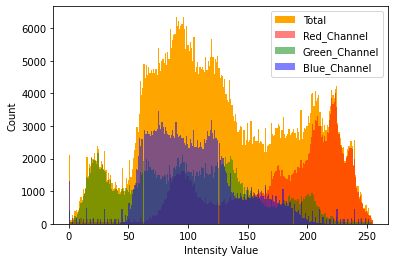

In [ ]:
histogram(image4)

###Correlation coefficient

#### Vertical

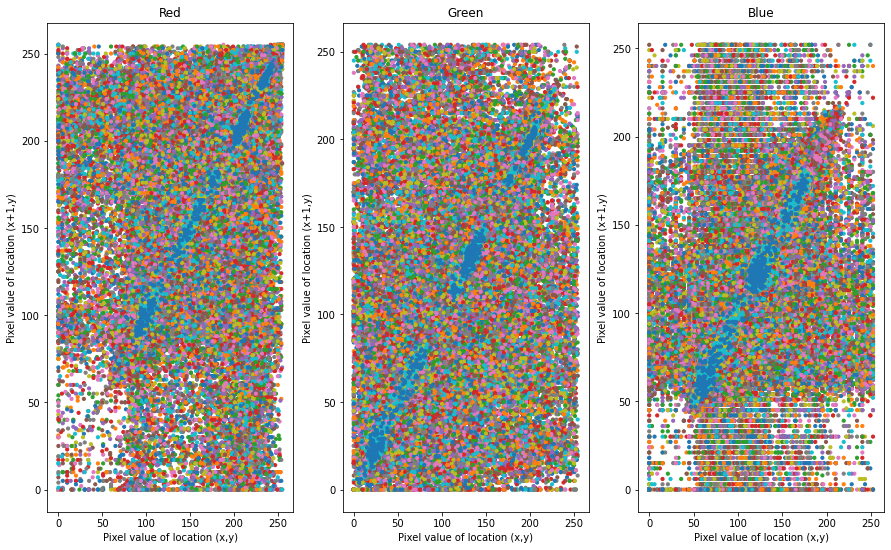

In [ ]:
printCorrelationVertical(image4)

In [ ]:
corr1 = correlation(image4,'vertical',0)
corr2 = correlation(image4,'vertical',1)
corr3 = correlation(image4,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.6360325440552937
The vertical correlation coefficient of the green component is : 0.6643288689357912
The vertical correlation coefficient of the blue component is : 0.5292011460727958


#### Horizontal

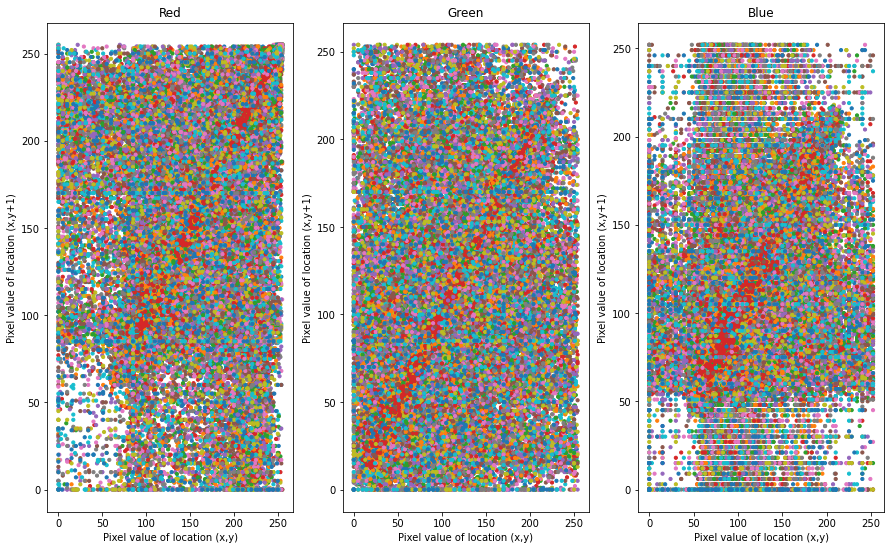

In [ ]:
printCorrelationHorizontal(image4)

In [ ]:
corr1 = correlation(image4,'horizontal',0)
corr2 = correlation(image4,'horizontal',1)
corr3 = correlation(image4,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.7175193870570375
The horizontal correlation coefficient of the green component is : 0.7823610521244999
The horizontal correlation coefficient of the blue component is : 0.6305728784172738


## r = w+1
## epoch = 70

In [ ]:
filename = 'lena.png'
r = w+1
ep = 70
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)



--- 12.159403324127197 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

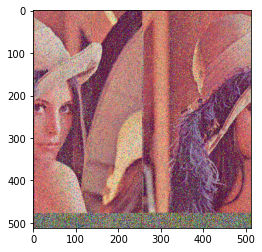

In [ ]:
image5 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image5)
plt.show

###Histogram

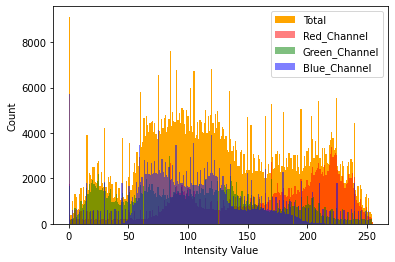

In [ ]:
histogram(image5)

###Correlation coefficient

#### Vertical

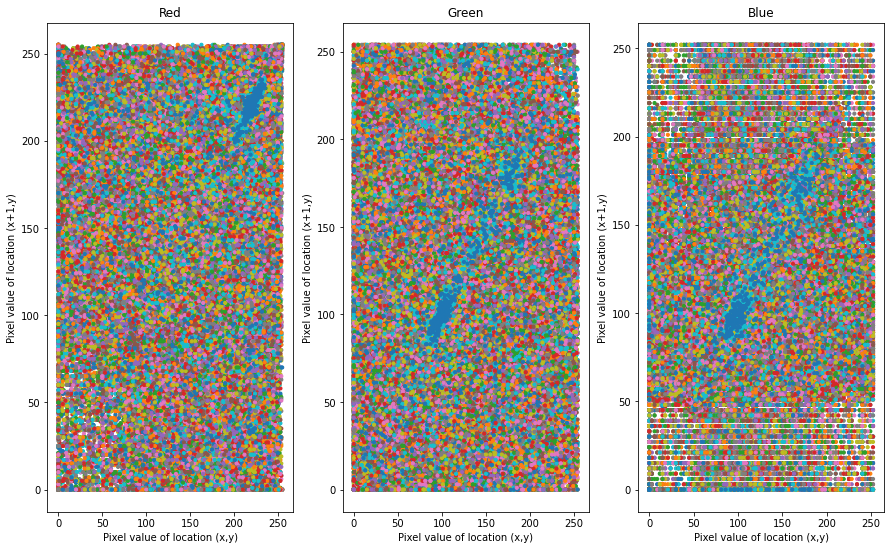

In [ ]:
printCorrelationVertical(image5)

In [ ]:
corr1 = correlation(image5,'vertical',0)
corr2 = correlation(image5,'vertical',1)
corr3 = correlation(image5,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.3056077056753654
The vertical correlation coefficient of the green component is : 0.3241246339499868
The vertical correlation coefficient of the blue component is : 0.199005811523962


#### Horizontal

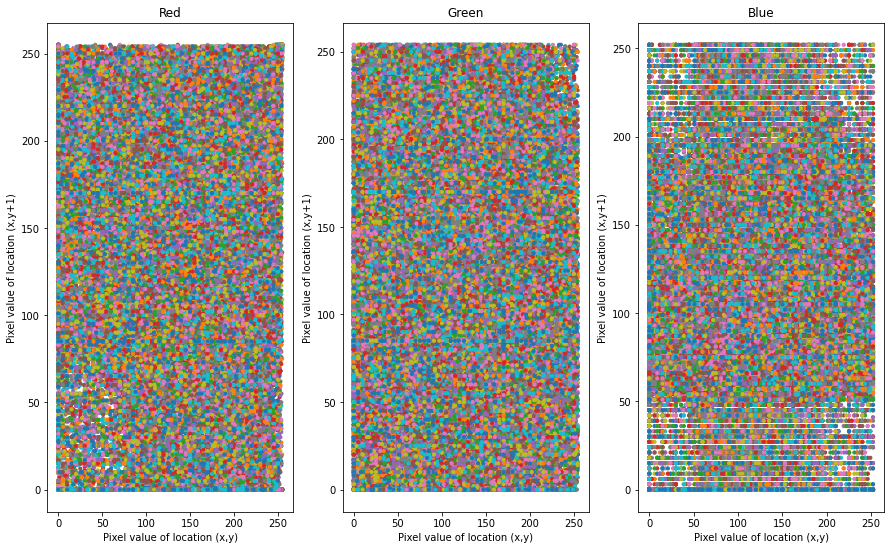

In [ ]:
printCorrelationHorizontal(image5)

In [ ]:
corr1 = correlation(image5,'horizontal',0)
corr2 = correlation(image5,'horizontal',1)
corr3 = correlation(image5,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.3489843547771665
The horizontal correlation coefficient of the green component is : 0.4103571144812961
The horizontal correlation coefficient of the blue component is : 0.2578304584243713


## r = w+1
## epoch = 140

In [ ]:
filename = 'lena.png'
r = w+1
ep = 140
population,lenght,w,h,p = loadImage(filename, r)
pop = GENETIC_ALGORITHM(filename,array_chaotic , r, ep)



--- 24.080641746520996 seconds ---


<function matplotlib.pyplot.show(*args, **kw)>

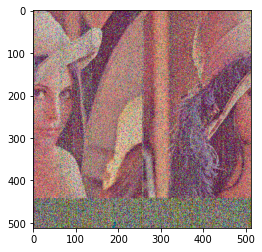

In [ ]:
image6 = cv2.cvtColor(reShapeImage(pop, h, w), cv2.COLOR_BGR2RGB)
plt.imshow(image6)
plt.show

###Correlation coefficient

###Histogram

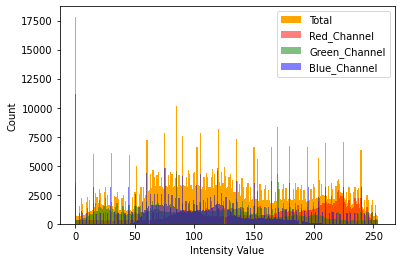

In [ ]:
histogram(image6)

#### Vertical

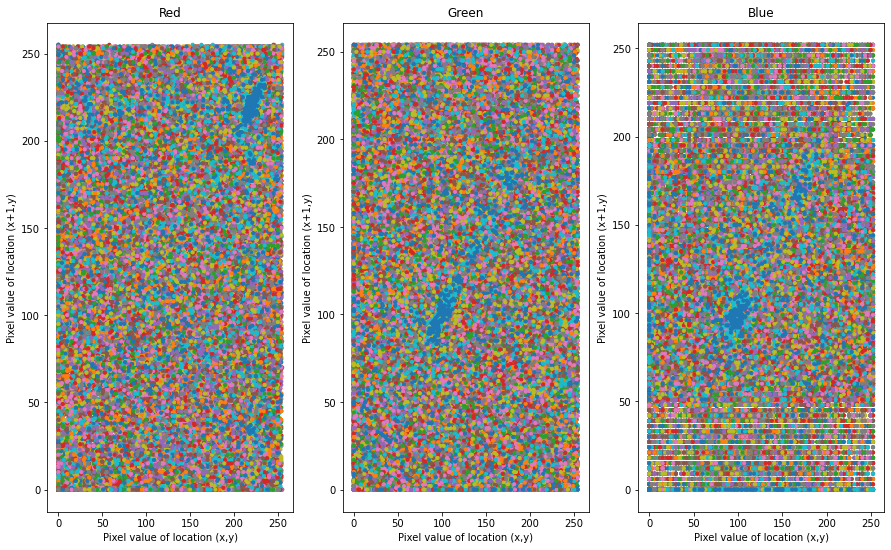

In [ ]:
printCorrelationVertical(image6)

In [ ]:
corr1 = correlation(image6,'vertical',0)
corr2 = correlation(image6,'vertical',1)
corr3 = correlation(image6,'vertical',2)

print(f"The vertical correlation coefficient of the red component is : {corr1}")
print(f"The vertical correlation coefficient of the green component is : {corr2}")
print(f"The vertical correlation coefficient of the blue component is : {corr3}")

The vertical correlation coefficient of the red component is : 0.15372998230139265
The vertical correlation coefficient of the green component is : 0.15459342437825704
The vertical correlation coefficient of the blue component is : 0.0804125658600977


#### Horizontal

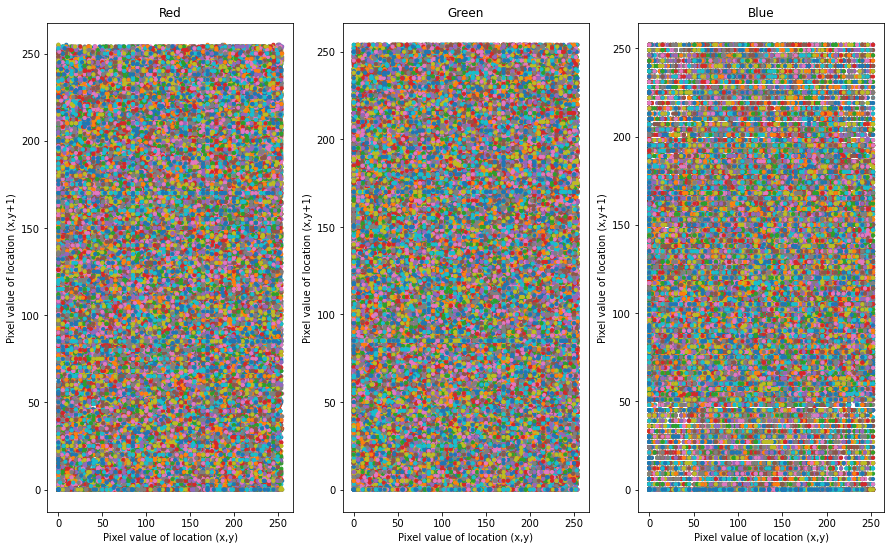

In [ ]:
printCorrelationHorizontal(image6)

In [ ]:
corr1 = correlation(image6,'horizontal',0)
corr2 = correlation(image6,'horizontal',1)
corr3 = correlation(image6,'horizontal',2)

print(f"The horizontal correlation coefficient of the red component is : {corr1}")
print(f"The horizontal correlation coefficient of the green component is : {corr2}")
print(f"The horizontal correlation coefficient of the blue component is : {corr3}")

The horizontal correlation coefficient of the red component is : 0.175833337003556
The horizontal correlation coefficient of the green component is : 0.20260854037585657
The horizontal correlation coefficient of the blue component is : 0.11696768101601579
